In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

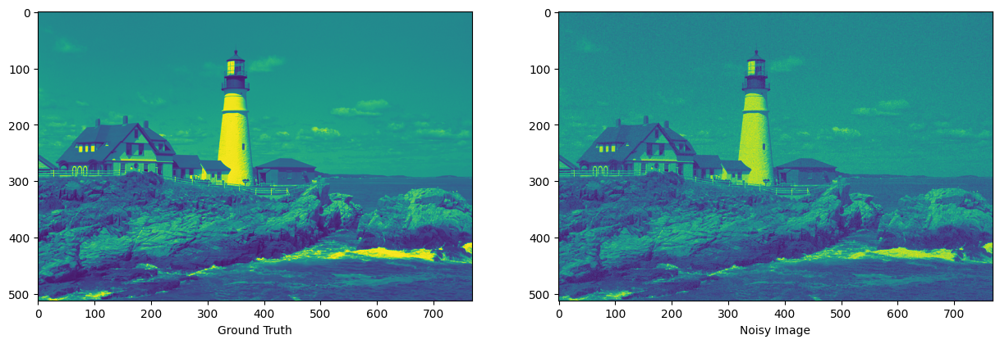

In [3]:
def add_gaussian_noise(image, mean=0, std=10):
    height, width = image.shape
    gaussian_noise = np.random.normal(mean, std, (height, width))
    noisy_image = np.array(image + gaussian_noise, dtype=np.float64)
    return noisy_image

# Load an image
image = cv2.imread("lighthouse2.bmp")

gray_image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# Add Gaussian noise
noisy_image = add_gaussian_noise(gray_image)

# Display the original and noisy images
figure_size = 15
plt.figure(figsize=(figure_size,figure_size))
plt.subplot(1,2,1)
plt.imshow(gray_image)
plt.xlabel("Ground Truth")
plt.subplot(1,2,2)
plt.imshow(noisy_image)
plt.xlabel("Noisy Image")
plt.show()

## Denoising methods

### Gaussian filtering

Filter size: 3, sigma: 0.1, MSE: 99.68954384612137
Filter size: 3, sigma: 1, MSE: 89.61758068120952
Filter size: 3, sigma: 2, MSE: 110.3397903192551
Filter size: 3, sigma: 4, MSE: 115.71790916495696
Filter size: 3, sigma: 8, MSE: 117.06436255615598
Filter size: 7, sigma: 0.1, MSE: 99.68954384612137
Filter size: 7, sigma: 1, MSE: 114.84938115499891
Filter size: 7, sigma: 2, MSE: 217.9427801482279
Filter size: 7, sigma: 4, MSE: 266.2339282462903
Filter size: 7, sigma: 8, MSE: 279.7795436538633
Filter size: 11, sigma: 0.1, MSE: 99.68954384612137
Filter size: 11, sigma: 1, MSE: 114.89874365781128
Filter size: 11, sigma: 2, MSE: 233.74776887599648
Filter size: 11, sigma: 4, MSE: 326.96013516631547
Filter size: 11, sigma: 8, MSE: 361.04529027001246
Therefore, filter with best MSE, size: 3 * 3 and sigma: 1


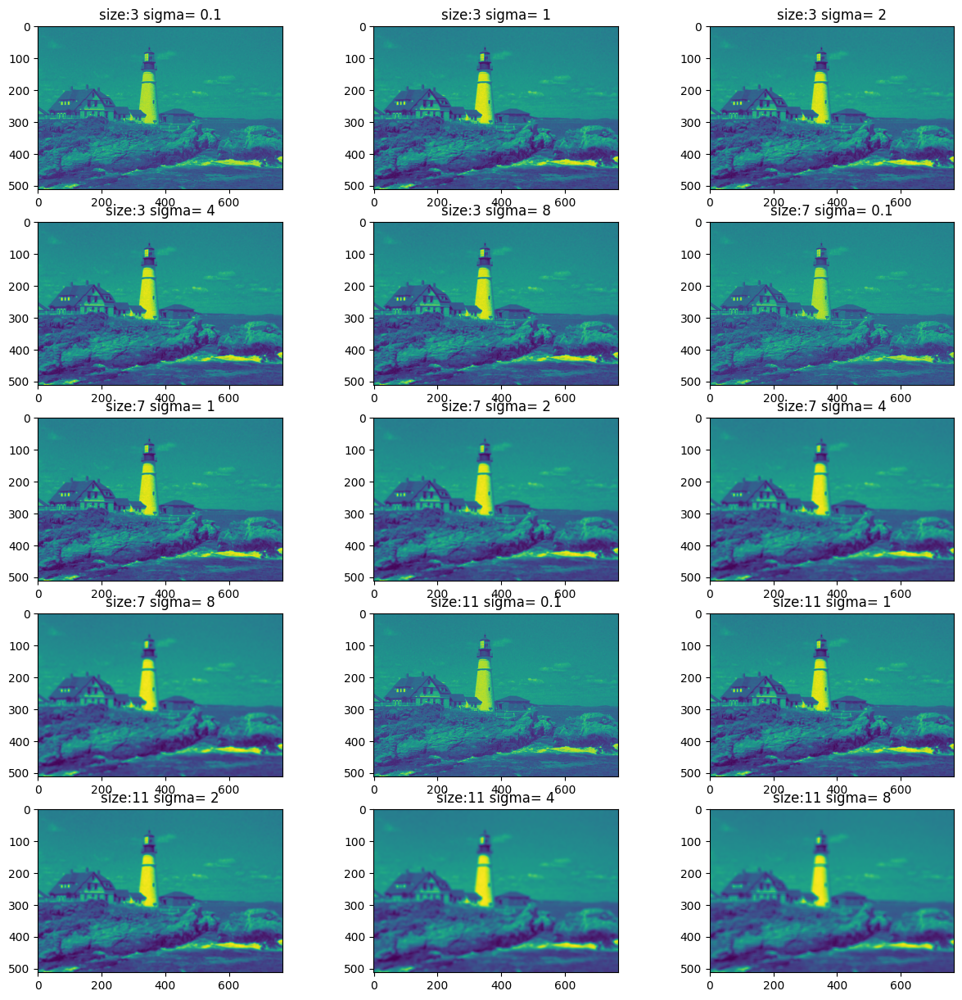

In [14]:
size_lst = [3, 7, 11]
sigma_lst = [0.1, 1, 2, 4, 8]
min_mse = float('inf')
i = 0
mse1 = []
plt.figure(figsize=(15,15))
for size in size_lst:
    for sigma in sigma_lst:
        i+=1
        blur_img = cv2.GaussianBlur(noisy_image,(size,size),sigma)
        cv2.imwrite(f"size{size}_sigma{sigma}.jpg",blur_img)
        
        mse = np.mean((gray_image-blur_img)**2)
        if size==3:
            mse1.append(mse)    #extracting mse for 3*3 filter
        print(f"Filter size: {size}, sigma: {sigma}, MSE: {mse}")
        plt.subplot(5,3,i)
        plt.imshow(blur_img)
        plt.title(f"size:{size} sigma= {sigma}")
        if mse < min_mse:
            min_mse = mse
            best_filter = [size, sigma]

mse1 = mse1[1:]
print(f"Therefore, filter with best MSE, size: {best_filter[0]} * {best_filter[0]} and sigma: {best_filter[1]}")
plt.show()

## Adaptive MMSE

### Adaptive MMSE on 32 * 32 patches with stride 16

In [5]:
sigmasq_z = 100
patch_size = 32
stride = 16

def y_lpf(image, size, sigma):
    return cv2.GaussianBlur(image, (size, size), sigma)

def w(kernel_size, sigma):
    kernel_2D = np.zeros((kernel_size, kernel_size))
    center = kernel_size // 2
    for i in range(kernel_size):
        for j in range(kernel_size):
            kernel_2D[i, j] = np.exp(-((i - center)**2 + (j - center)**2) / (2 * sigma**2))
    kernel_2D /= np.sum(kernel_2D)
    return kernel_2D, center

def denoise_image(size, sigma, noisy_image):

    height, width = noisy_image.shape
    kernel, center = w(size, sigma)

    sigmasq_z1 = ((1-kernel[center,center])**2 + np.sum((kernel)**2 ) - (kernel[center,center])**2) * sigmasq_z
  
    #print(f"Var(Z1): ",round(sigmasq_z1, 2))
    
    mu_y = y_lpf(noisy_image, size, sigma)
    y1 = noisy_image - mu_y
 
    #print(f"Var(Y1): ",round(np.var(y1), 2))

    # Initialize output image and count map
    output_image = np.zeros_like(noisy_image, dtype=np.float64)
    count_map = np.zeros_like(noisy_image, dtype=np.float64)

    for y in range(0, height - patch_size + 1, stride):
        for x in range(0, width - patch_size + 1, stride):
            y1_patch = y1[y:y+patch_size, x:x+patch_size]
            sigmasq_y1_patch = np.var(y1_patch)
            sigmasq_x1_patch = sigmasq_y1_patch - sigmasq_z1
            x1_estimate_patch = (sigmasq_x1_patch / (sigmasq_x1_patch + sigmasq_z1)) * y1_patch
            x_estimate_patch = x1_estimate_patch + mu_y[y:y+patch_size, x:x+patch_size]

            output_image[y:y+patch_size, x:x+patch_size] += x_estimate_patch
            count_map[y:y+patch_size, x:x+patch_size] += 1

    # Compute the average intensity value for pixels belonging to multiple patches
    output_image /= count_map
    
    return output_image, sigmasq_z1



def mse(gray_image, noisy_image, denoised_image):
    mse_noisy = np.mean((noisy_image-gray_image)**2)
    mse_output = np.mean((denoised_image-gray_image)**2)
    return mse_noisy, mse_output

def plot(noisy_image, denoised_image, mse_noisy, mse_denoised, size, sigma):
    figure_size = 15
    plt.figure(figsize=(figure_size,figure_size))
    plt.suptitle("size = {}, sigma = {}, MSE Noisy image = {:.2f}, MSE denoised image = {:.2f}".format(size, sigma, mse_noisy, mse_denoised))
    plt.subplot(3,2,1)
    plt.imshow(noisy_image)
    plt.xlabel("noisy image")
    plt.subplot(3,2,2)
    plt.imshow(denoised_image)
    plt.xlabel("output_image")
    plt.show()

    cv2.imwrite("denoisedimg_{}_{}.jpg".format(size, sigma),denoised_image)
    return 



### Output with different size and sigma values:

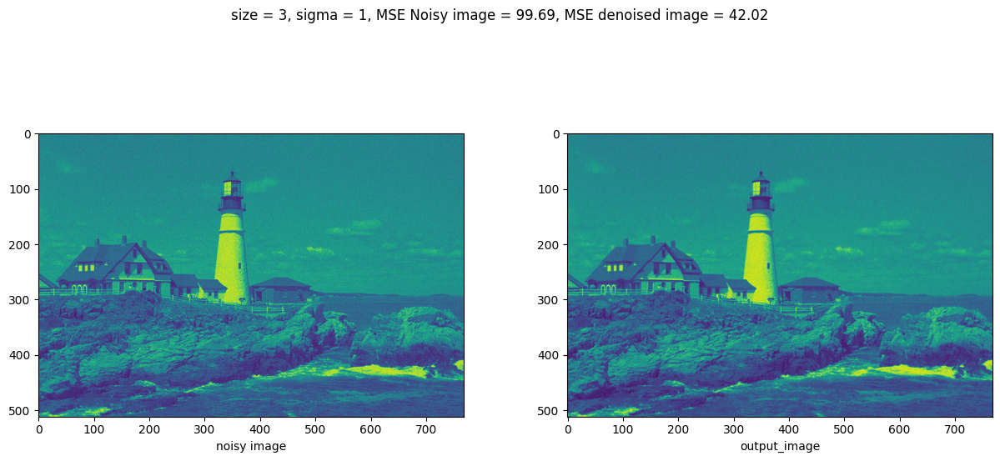

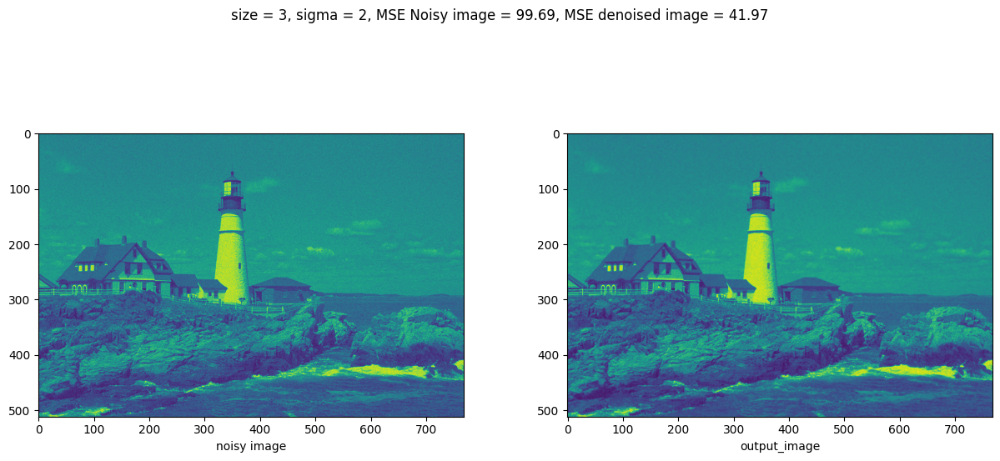

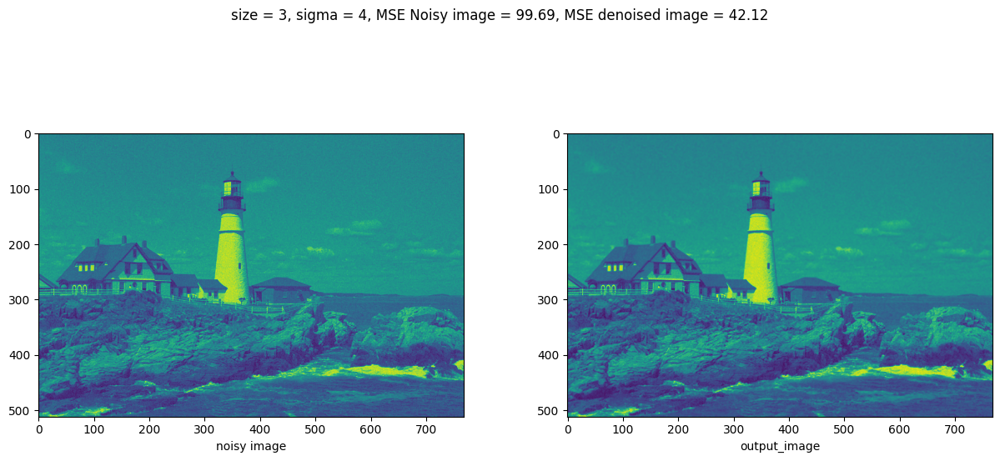

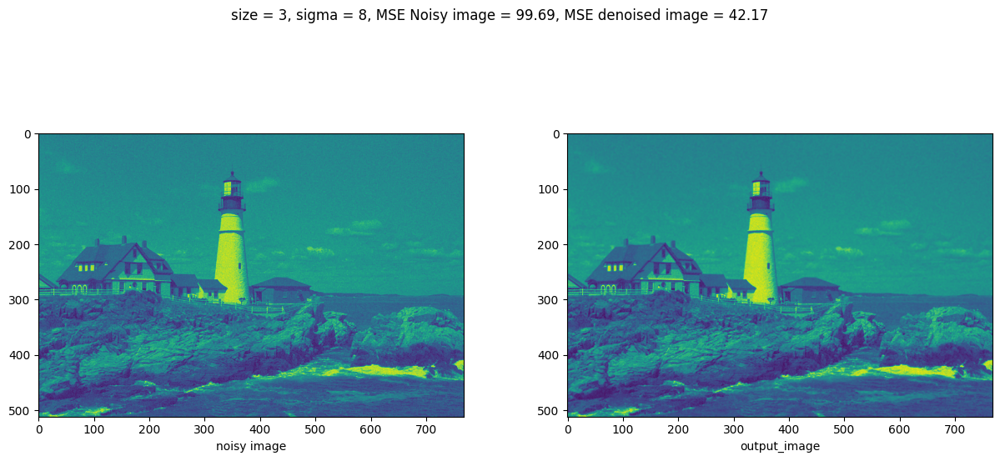

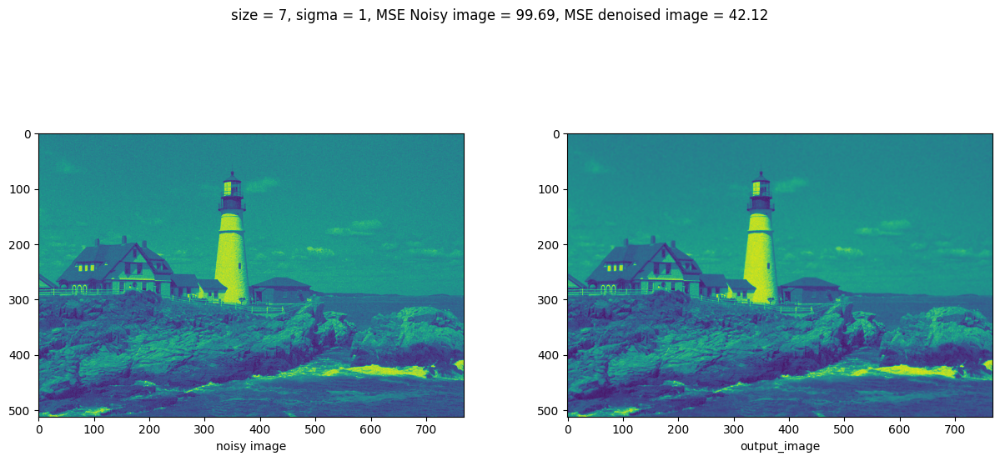

...

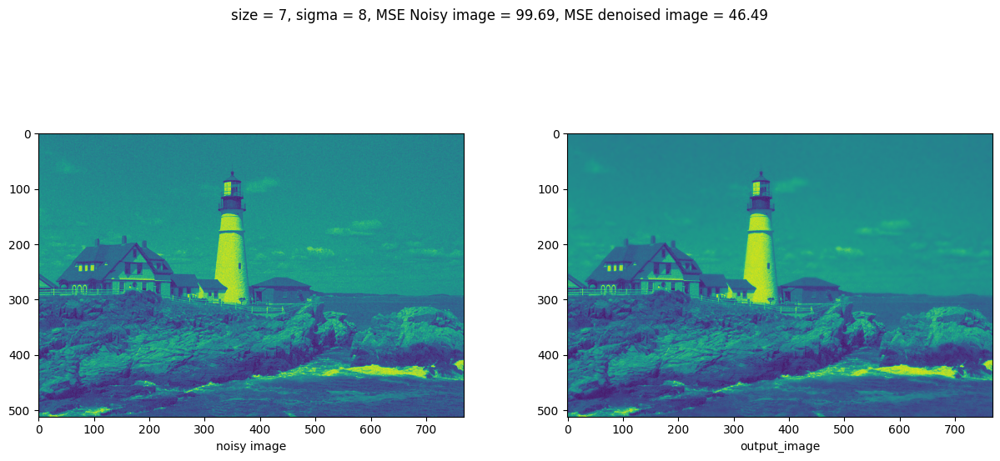

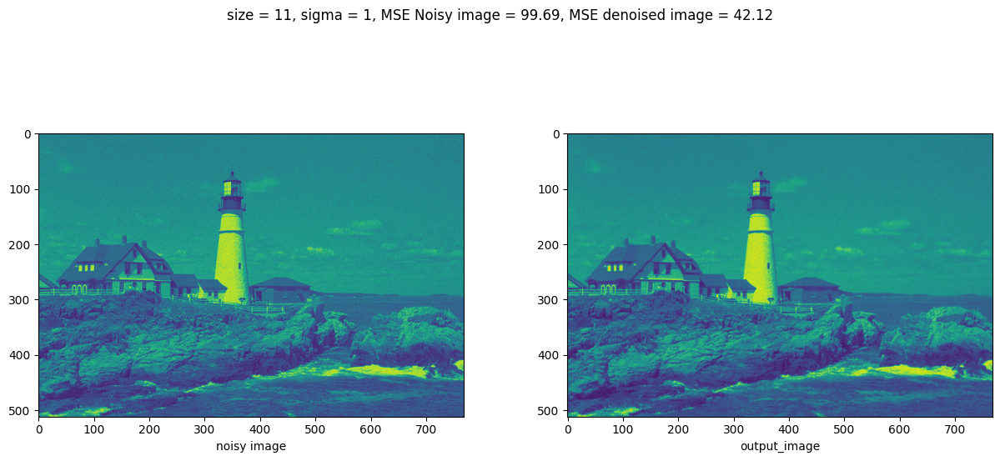

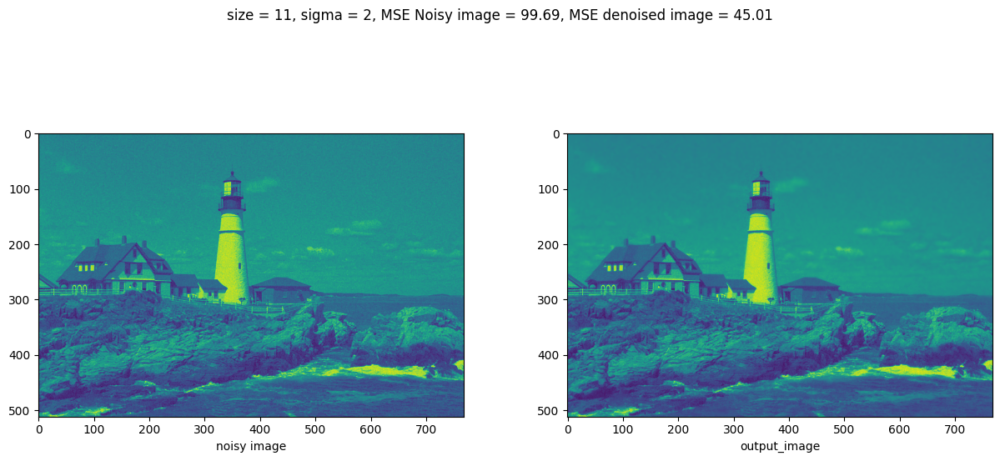

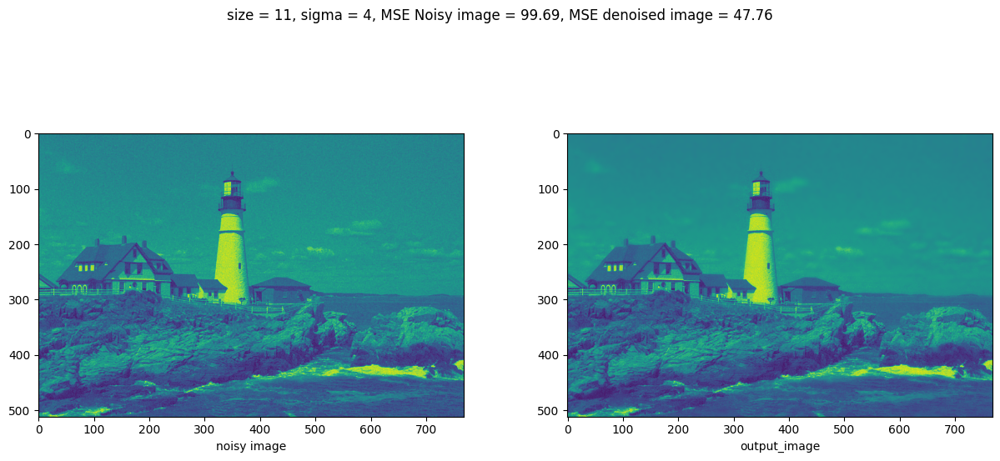

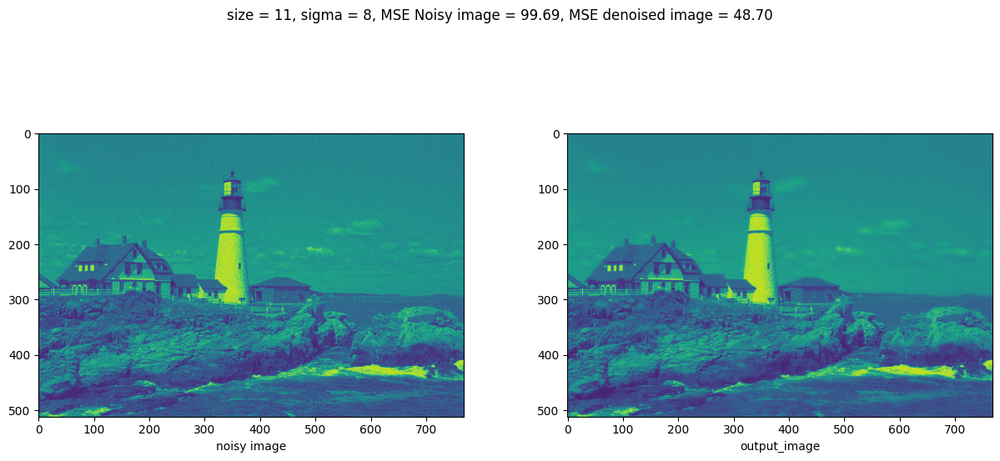

Filter size: 3, sigma: 1, MSE: 42.019783585023184
Filter size: 3, sigma: 2, MSE: 41.96577569699544
Filter size: 3, sigma: 4, MSE: 42.1190536940409
Filter size: 3, sigma: 8, MSE: 42.16577796685676
Filter size: 7, sigma: 1, MSE: 42.11677039047212
Filter size: 7, sigma: 2, MSE: 44.546377567753474
Filter size: 7, sigma: 4, MSE: 46.05549356671698
Filter size: 7, sigma: 8, MSE: 46.48581085394679
Filter size: 11, sigma: 1, MSE: 42.116816828378745
Filter size: 11, sigma: 2, MSE: 45.006947916666945
Filter size: 11, sigma: 4, MSE: 47.764302519314235
Filter size: 11, sigma: 8, MSE: 48.69722202244673
[42.019783585023184, 41.96577569699544, 42.1190536940409, 42.16577796685676]


True

In [10]:
sizes = [3, 7, 11]
sigmas = [1, 2, 4, 8]
mse_val = float('inf')
mses = []

for size in sizes:
    for sigma in sigmas:
        denoised_image, sigmasq_z1 = denoise_image(size, sigma, noisy_image)
        mse_noisy, mse_denoised  = mse(gray_image, noisy_image, denoised_image)
        mses.append(mse_denoised)

        plot(noisy_image, denoised_image, mse_noisy, mse_denoised, size, sigma)
        if mse_denoised < mse_val:
            mse_val = mse_denoised
            best_parameters = [size, sigma]
i=-1
for size in sizes:
    for sigma in sigmas:
        i+=1
        
        print(f"Filter size: {size}, sigma: {sigma}, MSE: {mses[i]}")

mse2 = mses[:4] #extracting mse for 3*3 filter
print(mse2)
'''print("Best parameters: ")
print("Filter Size: ", best_parameters[0])
print("Filter Variance: ", best_parameters[1])'''

cv2.imwrite("ground_truth.jpg",gray_image)
cv2.imwrite("noisy_image.jpg",noisy_image)


## 2. c. Adaptive SURE Shrink 

In [7]:
import numpy as np

def y_lpf(image, size=3, sigma=1):
    return cv2.GaussianBlur(image, (size, size), sigma)

def compute_SURE(t, y, sigmasq_z1):
    m,n = y.shape

    term1 = m*n*sigmasq_z1
    term2 = np.sum(np.minimum(t,y)**2)
    term3 = -2 * sigmasq_z1 * np.sum(np.abs(y) < t)
    SURE = term1 + term2 + term3

    return SURE

def estimate_optimal_t(y):
    
    minimum = float('inf')
    t = np.linspace(1, 100, 100)
    for idx, item in enumerate(t):
        objective_func = compute_SURE(item, y, sigmasq_z1)
        if objective_func < minimum:
            minimum = objective_func
            t_star = item
    
    return t_star


MSE of Noisy Image:  99.68954384612137
MSE of SURE shrink denoised image:  59.354202663856874


True

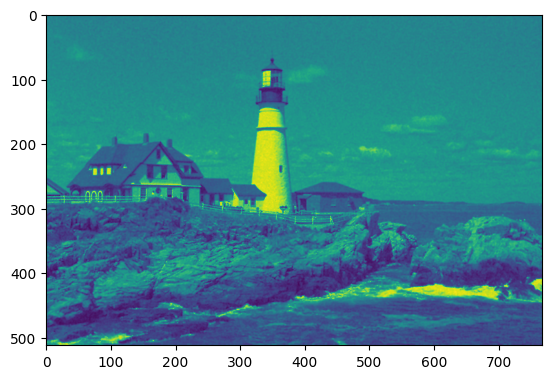

In [8]:
def sure_shrink(noisy_image):
    mu_y = y_lpf(noisy_image, size=3, sigma=1)
    y1 = noisy_image - mu_y
 
    height, width = noisy_image.shape
    x1_estimate = np.zeros_like(noisy_image, dtype=np.float64)
    count_map = np.zeros_like(noisy_image, dtype=np.float64)

    for y in range(0, height - patch_size + 1, stride):
        for x in range(0, width - patch_size + 1, stride):
            
            y1_patch = y1[y:y+patch_size, x:x+patch_size]
            optimal_t = estimate_optimal_t(y1_patch)

            # Apply the shrinkage function with the optimized threshold
            x1_estimate_patch = np.where(y1_patch >= optimal_t, y1_patch - optimal_t, y1_patch)
            x1_estimate_patch = np.where(y1_patch < -optimal_t, y1_patch + optimal_t, x1_estimate_patch)
            x1_estimate_patch = np.where((y1_patch > -optimal_t) & (y1_patch < optimal_t), 0, x1_estimate_patch)

            x1_estimate[y:y+patch_size, x:x+patch_size] += x1_estimate_patch
            count_map[y:y+patch_size, x:x+patch_size] += 1

    # Compute the average intensity value for pixels belonging to multiple patches
    x1_estimate /= count_map
    
    denoised_image = x1_estimate + mu_y
    
    return denoised_image


# Apply SureShrink to the high-pass coefficients of the noisy image
denoised_image = sure_shrink(noisy_image)
mmse_sure = mse(gray_image, noisy_image, denoised_image)

# Save or display the denoised image
plt.imshow(denoised_image)
print(f"MSE of Noisy Image: ",mmse_sure[0])
print(f"MSE of SURE shrink denoised image: ",mmse_sure[1])
cv2.imwrite("sure_shrink.jpg", denoised_image)


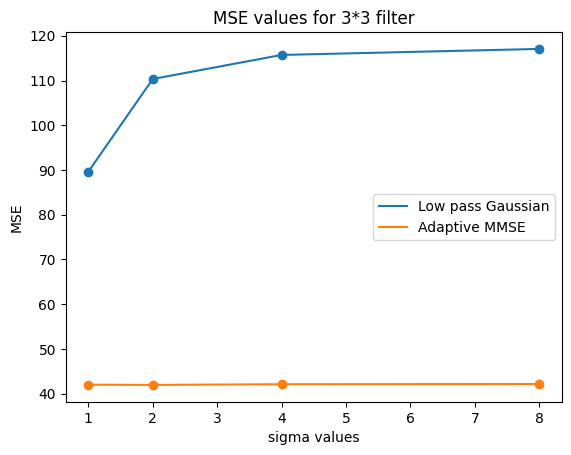

In [21]:
#comparison of Low pass Gaussian and Adaptive MMSE methods
plt.plot(sigmas, mse1, label='Low pass Gaussian')
plt.scatter(sigmas, mse1)
plt.plot(sigmas, mse2, label='Adaptive MMSE')
plt.scatter(sigmas, mse2)
plt.xlabel("sigma values")
plt.ylabel("MSE")
plt.title("MSE values for 3*3 filter")
plt.legend()
plt.show()